In [1]:
import pandas as pd
import healpy as hp
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import camb
from camb import model, initialpower

Import Planck satellite data like other notebook and add it to the df below. Then plot the difference between generated maps and the Planck map

In [2]:
input_cl = pd.read_csv("COM_PowerSpect_CMB-base-plikHM-TTTEEE-lowl-lowE-lensing-minimum-theory_R3.01.txt", delim_whitespace = True, index_col = 0)
input_cl.head()

,TT,TE,EE,BB,PP
L,,,,,
2,1016.730,2.61753,0.030883,0.000002,5.013520e-08
3,963.727,2.93806,0.039690,0.000004,6.099430e-08
4,912.608,2.75866,0.034496,0.000006,7.025920e-08
5,874.477,2.35185,0.023094,0.000009,7.829210e-08
6,848.509,1.89605,0.012951,0.000013,8.530200e-08


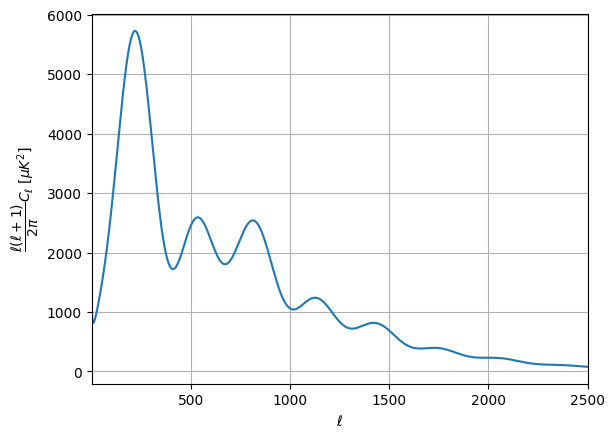

In [3]:
input_cl.TT.plot(logx = False, logy = False, grid = True)
plt.ylabel("$\dfrac{\ell(\ell+1)}{2\pi} C_\ell~[\mu K^2]$")
plt.xlabel("$\ell$")

plt.xlim([2, 2500]);

In [4]:
lmax = input_cl.index[-1]
cl = input_cl.divide(input_cl.index * (input_cl.index+1) / (np.pi*2), axis = "index")
cl /= 1e12
cl = cl.reindex(np.arange(0, lmax + 1))
cl = cl.fillna(0)
cl.head()

,TT,TE,EE,BB,PP
L,,,,,
0,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
1,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
2,1.064717e-09,2.741071e-12,3.234029e-14,1.904297e-18,5.250146e-20
3,5.046063e-10,1.538365e-12,2.078179e-14,1.904554e-18,3.193654e-20
4,2.867043e-10,8.666586e-13,1.083730e-14,1.904889e-18,2.207258e-20


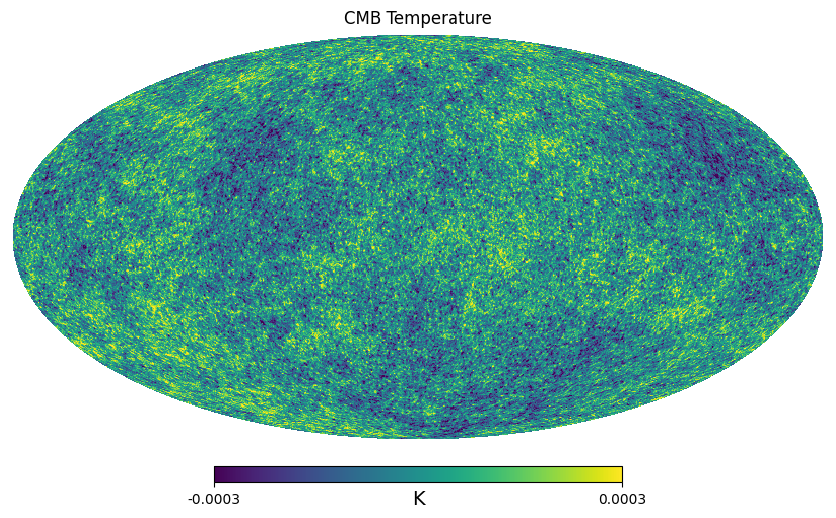

In [5]:
seed = 583
np.random.seed(seed)
alm = hp.synalm((cl.TT, cl.EE, cl.BB, cl.PP), lmax = lmax, new = True)
high_nside = 1024
cmb_map = hp.alm2map(alm, nside = high_nside, lmax = lmax)
hp.mollview(cmb_map[0], min = -300*1e-6, max=300*1e-6, unit="K", title = "CMB Temperature")

In [6]:
data_dict = {}

In [7]:
planck_data = input_cl['TT'].to_numpy()
planck_data = np.insert(planck_data, 0, 0)
planck_data = np.insert(planck_data, 0, 0)

data_dict["Planck data"] = planck_data[:2501]

In [8]:
def get_spectrum(H0, ombh2, omch2):

    """
    Calculate the CMB temperature power spectrum using CAMB for specified cosmological parameters.

    Parameters:
    - H0: Hubble constant at present (in km/s/Mpc).
    - ombh2: Physical density of baryonic matter (Ω_b h^2).
    - omch2: Physical density of cold dark matter (Ω_c h^2).

    Returns:
    - tt: Temperature power spectrum (C_l values for the temperature anisotropy).
    - ls: Multipole moments corresponding to the power spectrum values.

    Functionality:
    1. Sets up cosmological parameters using CAMB:
       - Flat universe assumption (Ω_k = 0).
       - Optical depth to reionisation (τ = 0.06).
       - Initial power spectrum parameters:
         - Scalar amplitude (A_s = 2e-9).
         - Scalar spectral index (n_s = 0.965).
         - Tensor-to-scalar ratio (r = 0).

    2. Adjusts CAMB settings for increased accuracy:
       - `lens_potential_accuracy` set to 4 for accurate lensing calculations.
       - `AccuracyBoost` set to 1 for higher precision in transfer function computations.

    3. Computes the CMB power spectrum:
       - Retrieves power spectra, including total and unlensed scalar contributions.
       - Extracts the temperature power spectrum.

    4. Generates the multipole moments (`ls`) corresponding to the power spectrum values.

    5. Stores the temperature power spectrum in a global dictionary (`data_dict`) with a key based on Ω_c h^2.
    """
    
    # Set up the cosmological parameters
    pars = camb.CAMBparams()
    pars.set_cosmology(H0 = H0, ombh2 = ombh2, omch2 = omch2, omk = 0, tau = 0.06)
    pars.InitPower.set_params(As = 2e-9, ns = 0.965, r = 0)
    pars.set_for_lmax(2458, lens_potential_accuracy = 4)  # Increased accuracy for lensing potential
    pars.set_accuracy(AccuracyBoost = 1)  # Increased accuracy for transfer functions

    # Calculate the matter power spectrum
    results = camb.get_results(pars)
    powers = results.get_cmb_power_spectra(pars, CMB_unit = 'muK')
    totCL = powers['total']
    # unlensedCL = powers['unlensed_scalar']

    # Extract temperature power spectrum
    tt = totCL[:,0]
    # un_tt = unlensedCL[:,0]

    ls = np.arange(totCL.shape[0])

    data_dict["tt_" + str(int(round(omch2*100, 2)))] = tt
    # data_dict["un_tt_" + str(int(round(omch2*100, 2)))] = un_tt

    return tt, ls

In [9]:
def plot_power_spectrum(ax, H0, ombh2, dark_matter_values):

    """
    Plot the CMB TT power spectra for varying dark matter density values.

    Parameters:
    - ax: Matplotlib Axes object where the plot will be drawn.
    - H0: Hubble constant at present (in km/s/Mpc).
    - ombh2: Physical density of baryonic matter (Ω_b h^2).
    - dark_matter_values: List of dark matter density values (Ω_c h^2) to be evaluated.

    Functionality:
    1. Sets up the plot:

    2. Iterates through the provided dark matter density values (`dark_matter_values`):
       - Calls the `get_spectrum` function to calculate the temperature power spectrum (`tt`) and multipole moments (`ls`).

    3. Adjusts plot limits:
       - Restricts the x-axis to multipole moments in the range [2, 2500].
       - Configures the x-axis to a logarithmic scale for better representation of the range.
    """

    ax.set_title('CMB TT Power Spectra for varying Dark Matter levels')
    #ax.set_xlim([2,1300])
    #ax.set_xscale('log')
    # ax.set_xlabel('Multipole Moment $l$')
    # ax.set_ylabel('Power Spectrum $C_l$')

    plt.ylabel("$\dfrac{\ell(\ell+1)}{2\pi} \mathcal{C}_\ell~[\mu K^2]$")
    plt.xlabel("$\ell$")

    plt.grid()

    for omch2 in dark_matter_values:
        tt, ls = get_spectrum(H0, ombh2, omch2)
        if omch2 != 0.01:
            ax.plot(ls, tt,  label = f'$\\Omega_c h^2$ = {round(omch2, 2)}') # label = str(round(omch2, 2))) # Dark Matter Density 
            #ax.plot(ls, un_tt, label = str(round(omch2, 2)) + " (Unlensed)") #, label=f'Dark Matter Density $\\Omega_c h^2$ = {omch2}')
    
    ax.set_xlim([2, 2500])
    ax.set_xscale('log')
    #ax.set_xlabel(r'$\ell$')

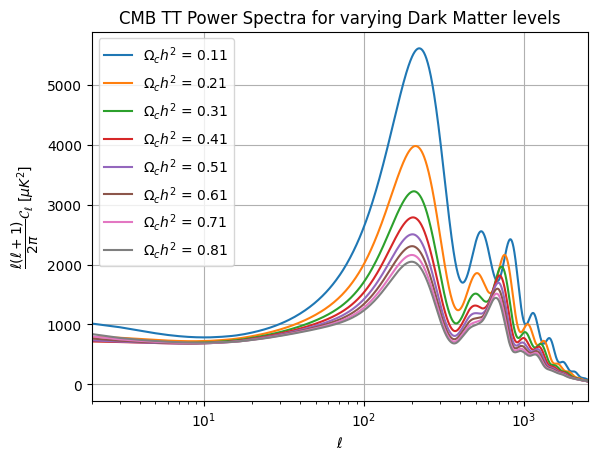

In [10]:
# Set cosmological parameters
H0 = 67.5  # Hubble constant in km/s/Mpc
ombh2 = 0.022  # Baryon physical density

# Define a range of dark matter values
dark_matter_values = np.linspace(0.01, 0.81, 9)

# Plot the temperature power spectrum for varying dark matter
fig, ax = plt.subplots()
plot_power_spectrum(ax, H0, ombh2, dark_matter_values)

plt.legend()
plt.show()

In [11]:
df = pd.DataFrame(data_dict)

In [ ]:
data_dict

{'Planck data': array([   0.    ,    0.    , 1016.73  , ...,   78.9822,   78.7514,
          78.5203]),
 'tt_1': array([   0.        ,    0.        , 1974.63272016, ...,  250.13522608,
         249.17040082,  248.20979191]),
 'tt_11': array([   0.        ,    0.        , 1015.09460955, ...,   78.35214845,
          78.1070718 ,   77.86260118]),
 'tt_21': array([  0.        ,   0.        , 788.99148251, ...,  59.8499065 ,
         59.76245619,  59.67436759]),
 'tt_31': array([  0.        ,   0.        , 723.51228362, ...,  51.20708283,
         51.08668453,  50.9663569 ]),
 'tt_41': array([  0.        ,   0.        , 716.24464677, ...,  48.62331292,
         48.52812724,  48.4333021 ]),
 'tt_51': array([  0.        ,   0.        , 734.44726131, ...,  48.72931511,
         48.65099542,  48.57290537]),
 'tt_61': array([  0.        ,   0.        , 764.71774212, ...,  49.65726853,
         49.58721655,  49.51724066]),
 'tt_71': array([  0.        ,   0.        , 800.81721091, ...,  50.90448

In [ ]:
df.head()

,Planck data,tt_1,tt_11,tt_21,tt_31,tt_41,tt_51,tt_61,tt_71,tt_81
0,0.000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,0.000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,1016.730,1974.632720,1015.094610,788.991483,723.512284,716.244647,734.447261,764.717742,800.817211,839.642781
3,963.727,1615.090940,953.047470,777.596322,719.708323,706.123879,712.605009,729.014904,750.534253,774.696127
4,912.608,1378.759997,895.658612,758.044574,710.061106,696.746934,699.464320,710.282801,725.380338,742.766046


(2, 2500)

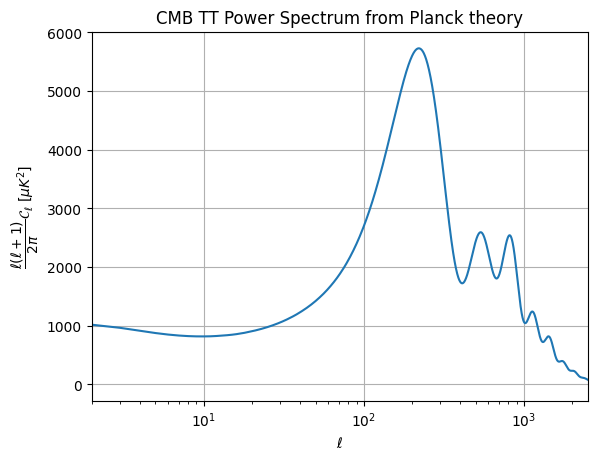

In [14]:
df['Planck data'].plot(logx = True, logy = False, grid = True)
plt.ylabel("$\dfrac{\ell(\ell+1)}{2\pi} \mathcal{C}_\ell~[\mu K^2]$")
plt.xlabel("$\ell$")
plt.title("CMB TT Power Spectrum from Planck theory")

plt.xlim([2, 2500])

In [ ]:
len(df)

2501

In [16]:
lmax = df.index[-1]
print(lmax)

2500


In [17]:
cl = df.divide(df.index * (df.index+1) / (np.pi*2), axis = "index")

In [18]:
cl /= 1e12

In [19]:
cl = cl.reindex(np.arange(0, lmax+1))

In [20]:
cl = cl.fillna(0)

In [21]:
cl.head()

,Planck data,tt_1,tt_11,tt_21,tt_31,tt_41,tt_51,tt_61,tt_71,tt_81
0,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
1,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
2,1.064717e-09,2.067831e-09,1.063005e-09,8.262299e-10,7.576603e-10,7.500496e-10,7.691114e-10,8.008105e-10,8.386138e-10,8.792719e-10
3,5.046063e-10,8.456596e-10,4.990145e-10,4.071485e-10,3.768384e-10,3.697256e-10,3.731191e-10,3.817113e-10,3.929788e-10,4.056299e-10
4,2.867043e-10,4.331502e-10,2.813795e-10,2.381467e-10,2.230723e-10,2.188895e-10,2.197432e-10,2.231419e-10,2.278850e-10,2.333468e-10


In [22]:
def plot_cmb_map(cl, column_num, lmax, high_nside = 1024, seed = 583):

    """
    Plot a CMB sky map for a specified column in the DataFrame.

    Parameters:
    - cl: pandas DataFrame containing the data.
    - column_number: Number (e.g., 11, 21, 31) used to select the column (tt_<number>).
    - lmax: Maximum multipole for the spherical harmonics.
    - high_nside: Nside for the map resolution (default: 1024).
    - seed: Seed for random number generation (default: 583).
    """
    
    # Construct the column name
    column_name = f"tt_{column_num}"
    
    # Check if the column exists
    if column_name not in cl.columns:
        raise ValueError(f"Column '{column_name}' not found in the DataFrame.")
    
    # Set seed for reproducibility
    np.random.seed(seed)
    
    # Generate and plot the CMB sky map
    alm = hp.synalm(cl[column_name], lmax = lmax, new = True)
    cmb_map = hp.alm2map(alm, nside = high_nside, lmax = lmax)
    title = f"CMB Sky Map ($\\Omega_c h^2$ = {column_num / 100:.2f})"
    hp.mollview(cmb_map, min = -300 * 1e-6, max = 300 * 1e-6, unit = "K", title = title)
    hp.graticule()

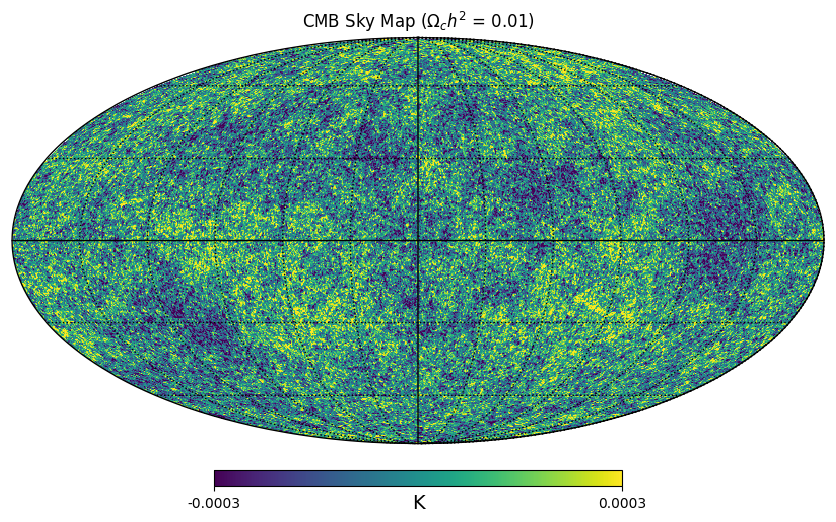

In [23]:
plot_cmb_map(cl = cl, column_num = 1, lmax = lmax)

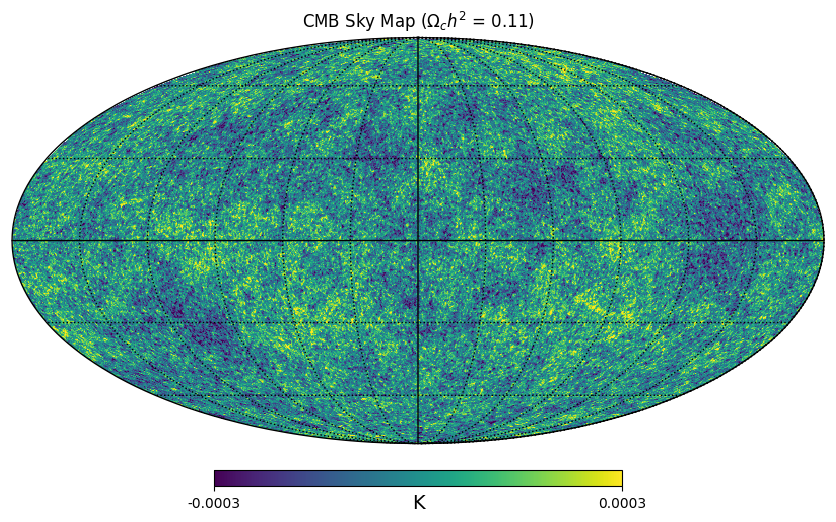

In [24]:
plot_cmb_map(cl = cl, column_num = 11, lmax = lmax)

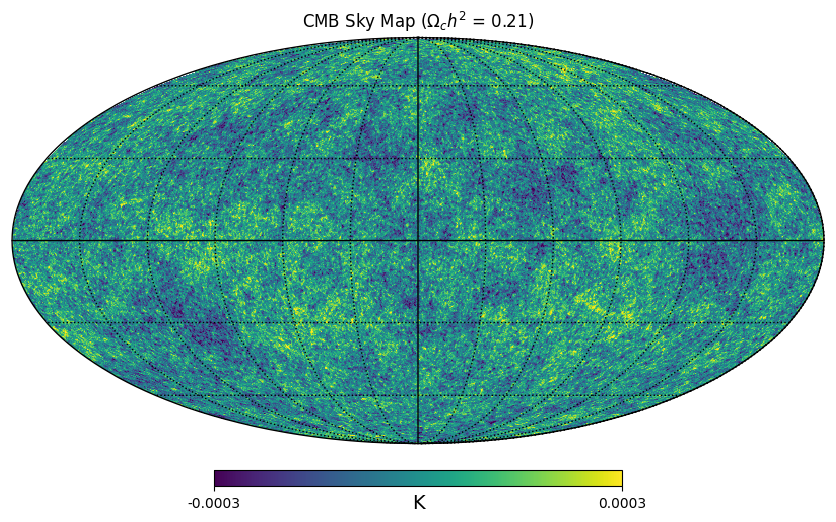

In [25]:
plot_cmb_map(cl = cl, column_num = 21, lmax = lmax)

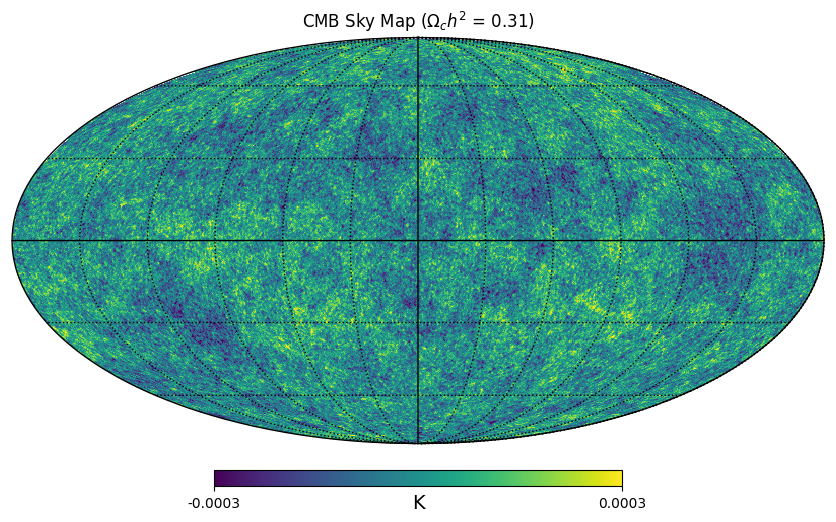

In [26]:
plot_cmb_map(cl = cl, column_num = 31, lmax = lmax)

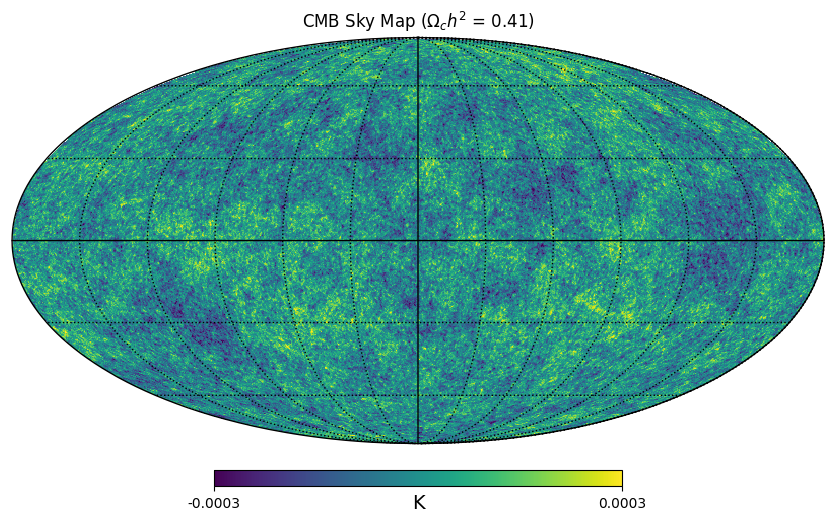

In [27]:
plot_cmb_map(cl = cl, column_num = 41, lmax = lmax)

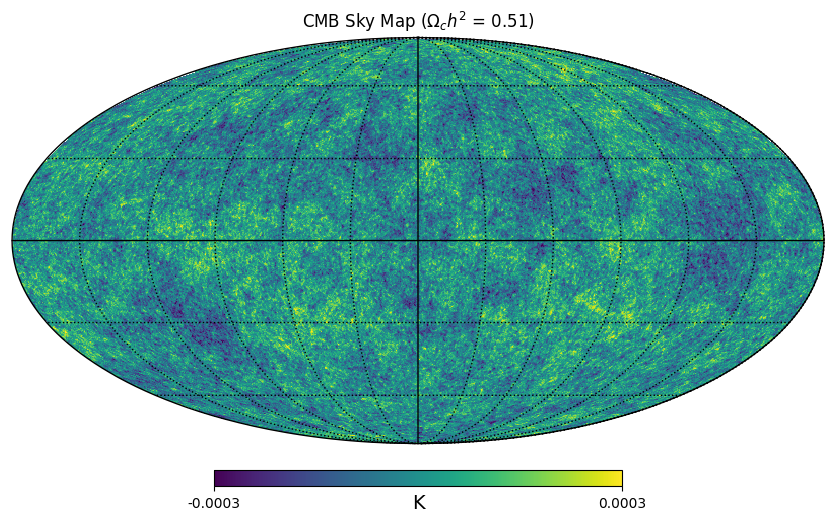

In [28]:
plot_cmb_map(cl = cl, column_num = 51, lmax = lmax)

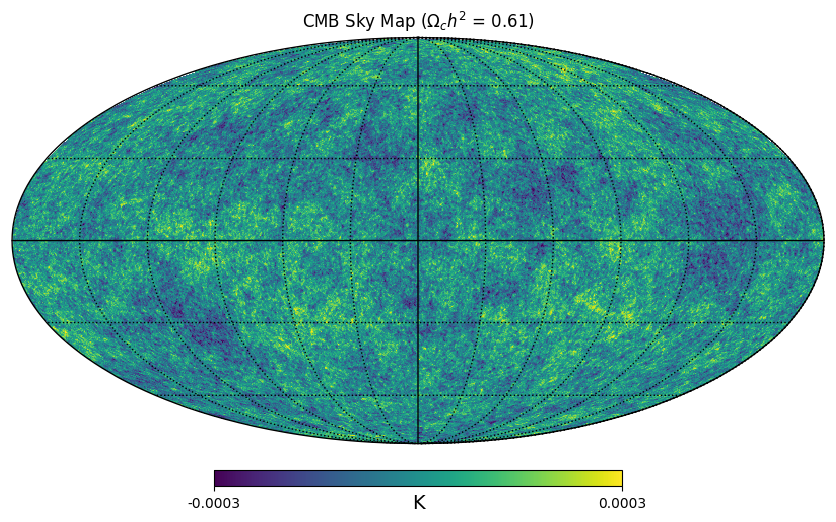

In [29]:
plot_cmb_map(cl = cl, column_num = 61, lmax = lmax)

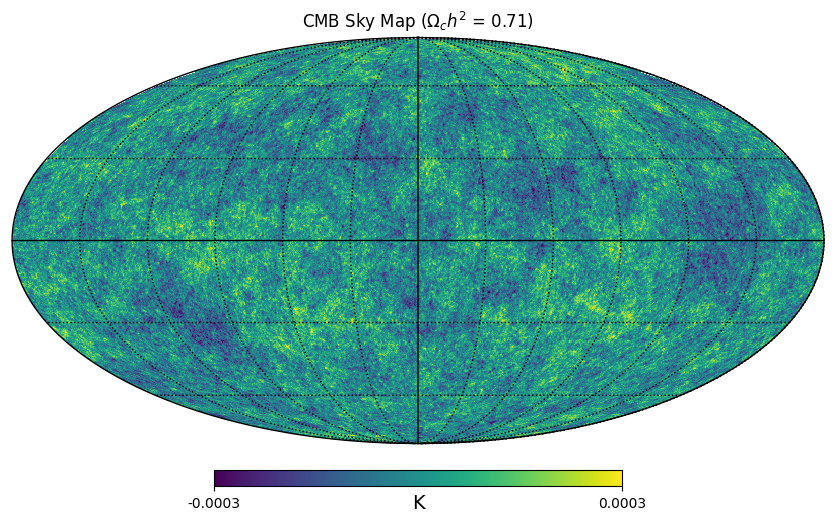

In [30]:
plot_cmb_map(cl = cl, column_num = 71, lmax = lmax)

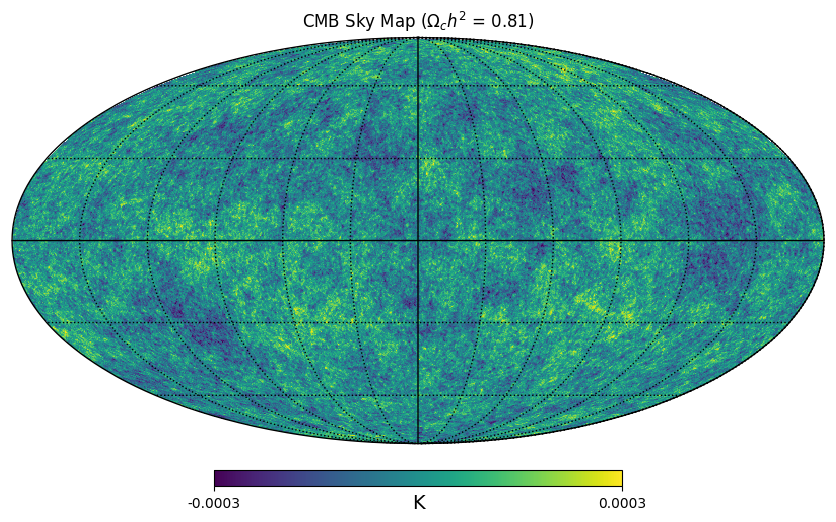

In [31]:
plot_cmb_map(cl = cl, column_num = 81, lmax = lmax)

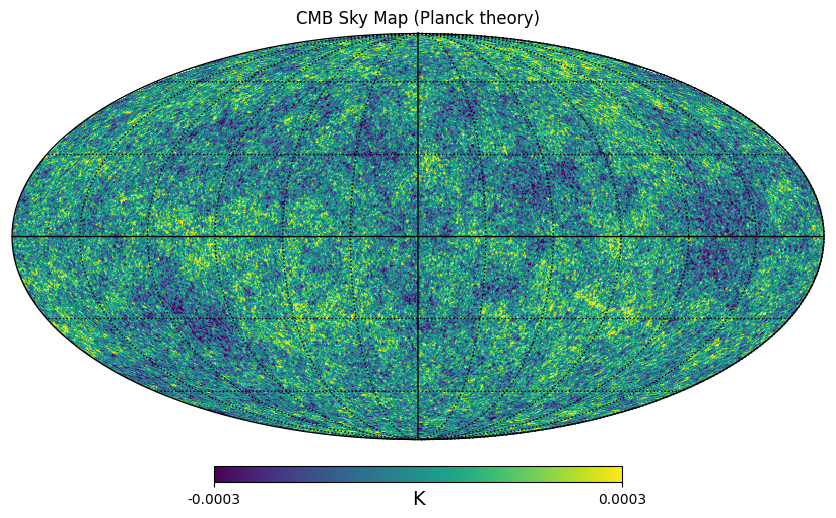

In [32]:
seed = 583
np.random.seed(seed)
alm_pd = hp.synalm(cl['Planck data'], lmax = lmax, new = True)
high_nside = 1024
cmb_map_pd = hp.alm2map(alm_pd, nside = high_nside, lmax = lmax)
hp.mollview(cmb_map_pd, min = -300*1e-6, max = 300*1e-6, unit = "K", title = "CMB Sky Map (Planck theory)")
hp.graticule()

In [33]:
for i in range(11, 82, 10):
    column_name = f'Planck_{i}_diff'
    cl[column_name] = cl['Planck data'] - cl[f'tt_{i}']

In [34]:
cl.head()

,Planck data,tt_1,tt_11,tt_21,tt_31,tt_41,tt_51,tt_61,tt_71,tt_81,Planck_11_diff,Planck_21_diff,Planck_31_diff,Planck_41_diff,Planck_51_diff,Planck_61_diff,Planck_71_diff,Planck_81_diff
0,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
1,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
2,1.064717e-09,2.067831e-09,1.063005e-09,8.262299e-10,7.576603e-10,7.500496e-10,7.691114e-10,8.008105e-10,8.386138e-10,8.792719e-10,1.712577e-12,2.384872e-10,3.070569e-10,3.146675e-10,2.956058e-10,2.639066e-10,2.261033e-10,1.854453e-10
3,5.046063e-10,8.456596e-10,4.990145e-10,4.071485e-10,3.768384e-10,3.697256e-10,3.731191e-10,3.817113e-10,3.929788e-10,4.056299e-10,5.591789e-12,9.745780e-11,1.277679e-10,1.348807e-10,1.314872e-10,1.228950e-10,1.116275e-10,9.897633e-11
4,2.867043e-10,4.331502e-10,2.813795e-10,2.381467e-10,2.230723e-10,2.188895e-10,2.197432e-10,2.231419e-10,2.278850e-10,2.333468e-10,5.324807e-12,4.855753e-11,6.363198e-11,6.781475e-11,6.696106e-11,6.356234e-11,5.881930e-11,5.335742e-11


In [35]:
def plot_diff_for_column(cl, column_num, lmax, high_nside = 1024, seed = 583):

    """
    Plot a difference map for a specified column in the DataFrame.

    Parameters:
    - cl: pandas DataFrame containing the data.
    - column_number: Number (e.g., 11, 21, 31) used to select the column (Planck_<number>_diff).
    - lmax: Maximum multipole for the spherical harmonics.
    - high_nside: Nside for the map resolution (default: 1024).
    - seed: Seed for random number generation (default: 583).
    """
    
    # Construct the column name
    column_name = f"Planck_{column_num}_diff"
    
    # Check if the column exists
    if column_name not in cl.columns:
        raise ValueError(f"Column '{column_name}' not found in the DataFrame.")
    
    # Set seed for reproducibility
    np.random.seed(seed)
    
    # Generate and plot the difference map
    alm_diff = hp.synalm(cl[column_name], lmax = lmax, new = True)
    cmb_map_diff = hp.alm2map(alm_diff, nside = high_nside, lmax = lmax)
    title = f"Difference between Planck and $\\Omega_c h^2$ = {column_num / 100:.2f} maps"
    hp.mollzoom(cmb_map_diff, min = -300 * 1e-6, max = 300 * 1e-6, unit = "K", title = title)
    hp.graticule()

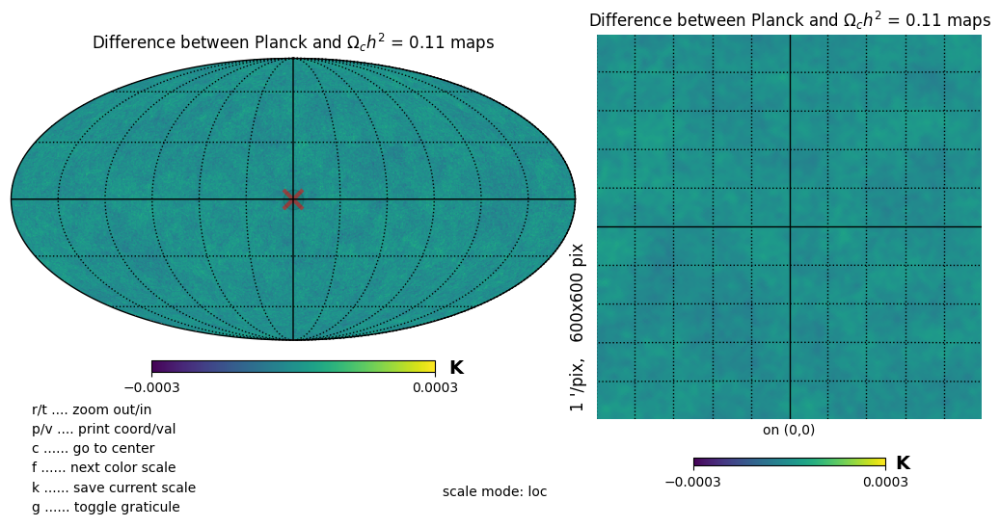

In [36]:
plot_diff_for_column(cl = cl, column_num = 11, lmax = lmax)

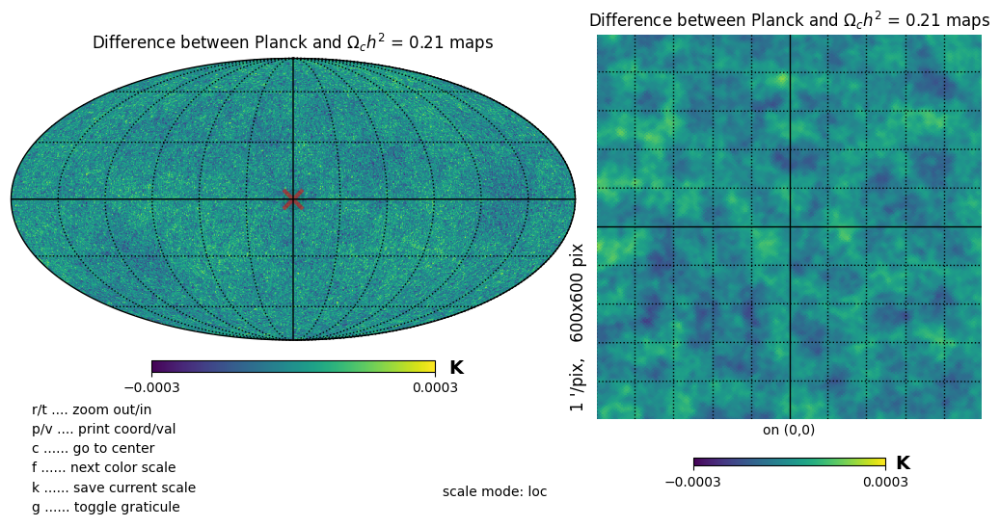

In [37]:
plot_diff_for_column(cl = cl, column_num = 21, lmax = lmax)

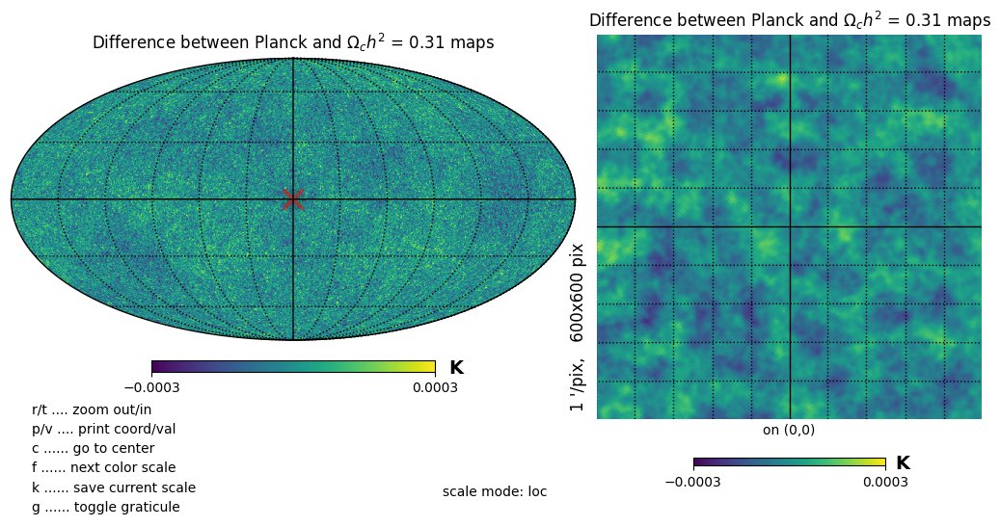

In [38]:
plot_diff_for_column(cl = cl, column_num = 31, lmax = lmax)

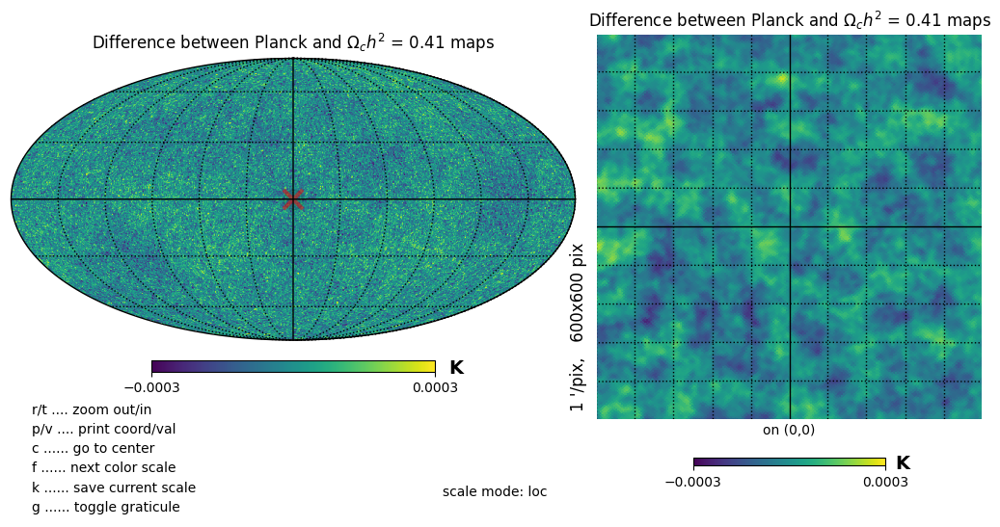

In [39]:
plot_diff_for_column(cl = cl, column_num = 41, lmax = lmax)

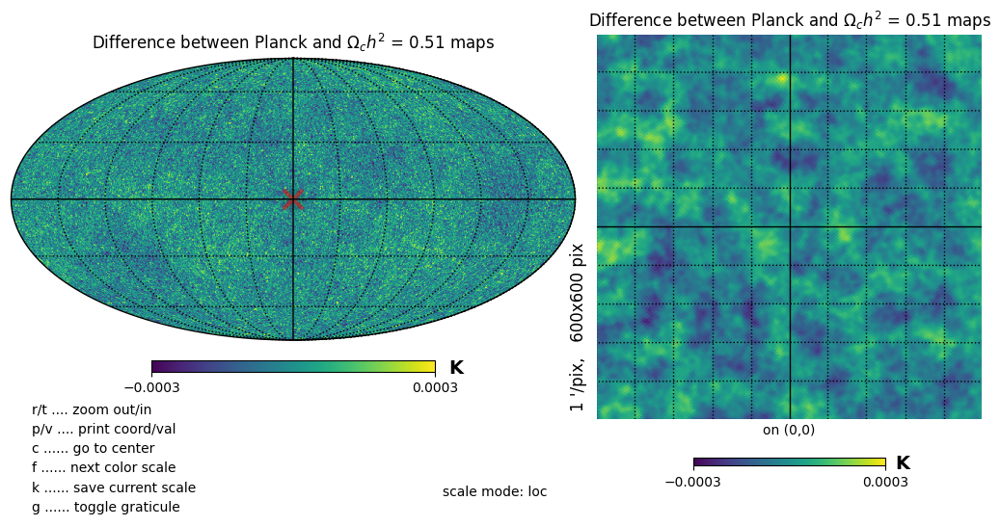

In [40]:
plot_diff_for_column(cl = cl, column_num = 51, lmax = lmax)

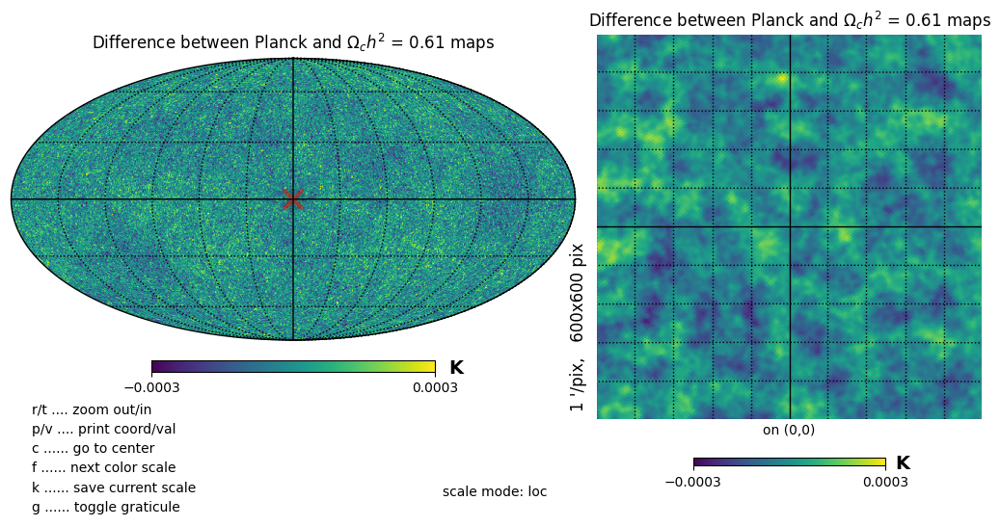

In [41]:
plot_diff_for_column(cl = cl, column_num = 61, lmax = lmax)

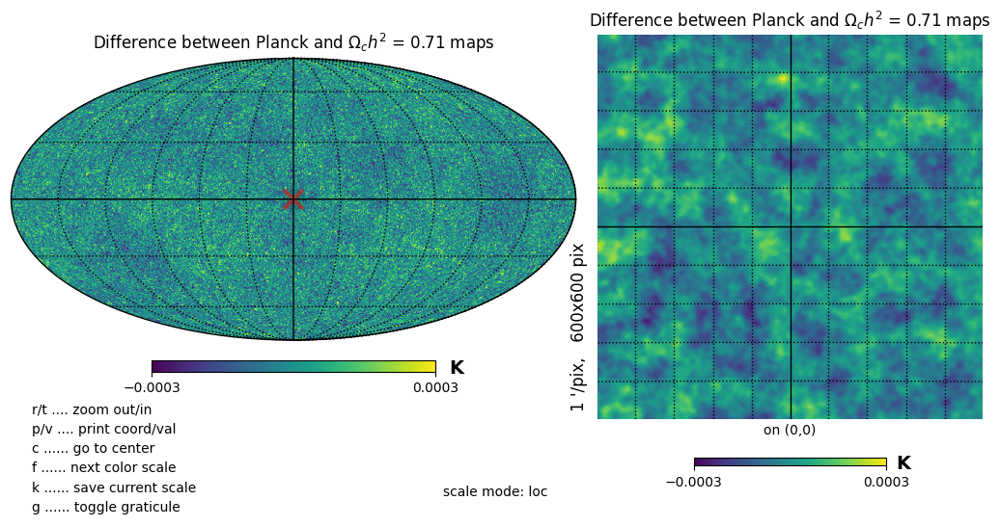

In [42]:
plot_diff_for_column(cl = cl, column_num = 71, lmax = lmax)

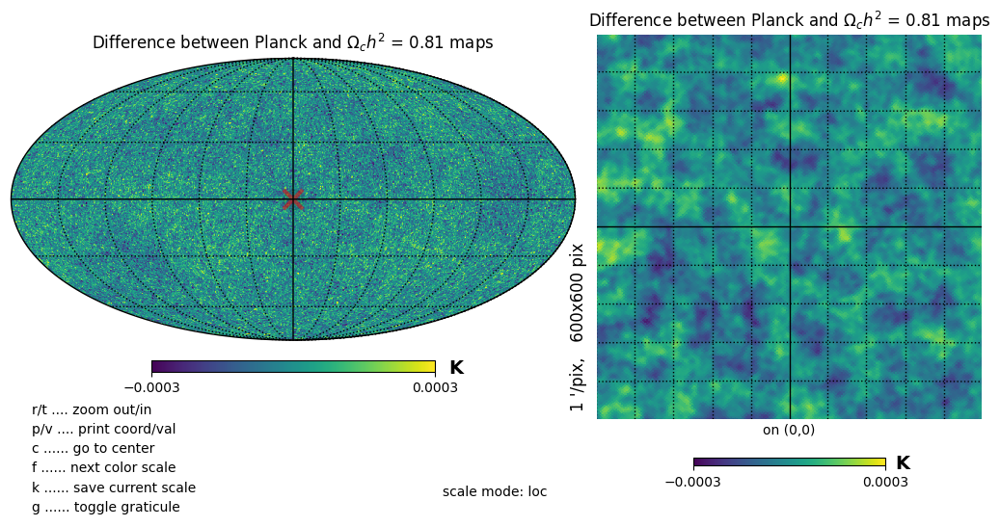

In [43]:
plot_diff_for_column(cl = cl, column_num = 81, lmax = lmax)